In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
tf.test.gpu_device_name()

'/device:GPU:0'

In [3]:
# Importing data
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    seed=123,
    shuffle=True,
    image_size= (256, 256),
    batch_size=32
)

Found 2152 files belonging to 3 classes.


In [4]:
classnames = dataset.class_names
classnames

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [5]:
# This is 69 because it has 68 batches and each batch has 32 images.
len(dataset)

68

In [6]:
for image_batch, label_batch in dataset.take(1): # This will take only 1 batch
    print(image_batch.shape) # we can see in result that it has 32 images and each image is 256,256,3
    print(label_batch.numpy())

(32, 256, 256, 3)
[1 1 1 0 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 2 0 0]


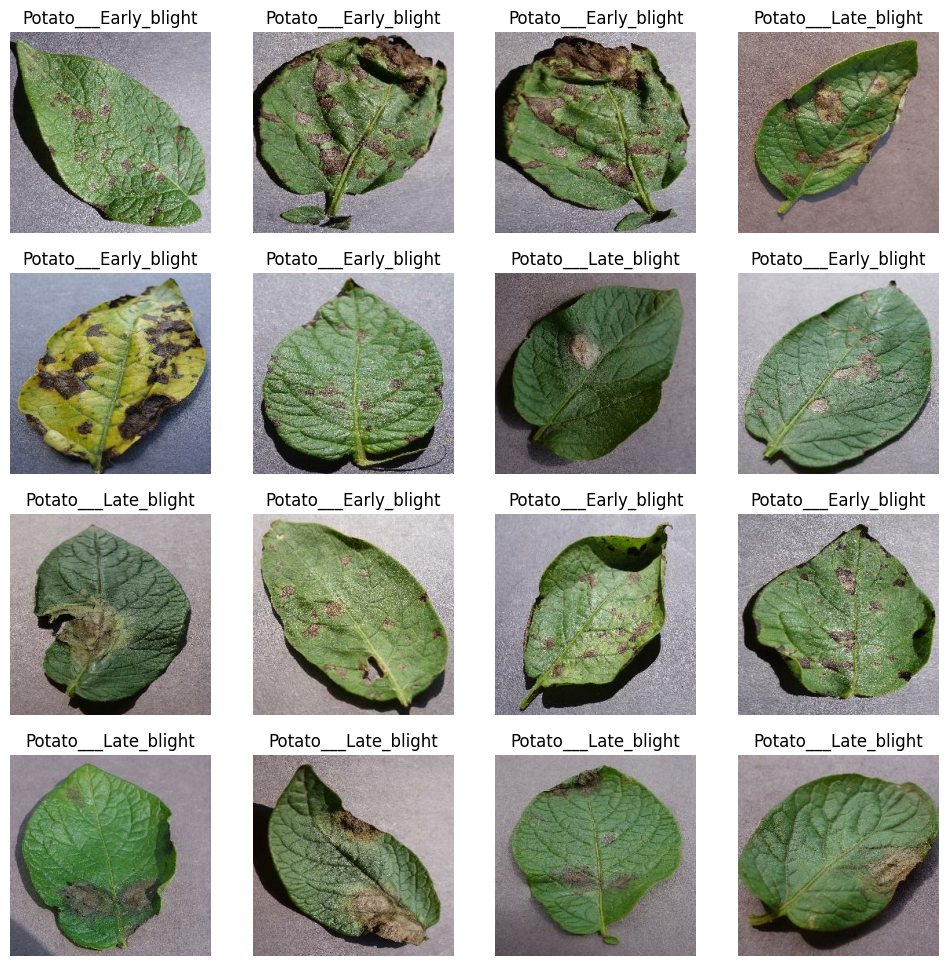

In [7]:
fig, axes = plt.subplots(4,4, figsize=(12,12))
for image_batch, label_batch in dataset.take(1):
    for i,ax in enumerate(axes.flat):
        ax.imshow(image_batch[i].numpy().astype('uint8'))
        ax.set_title(classnames[label_batch[i].numpy()])
        ax.set_axis_off()

# Dividing Dataset in Train, Test, and Validation

In [8]:
def splitdata(dataset, train_split = 0.8, test_split = 0.1, val_split = 0.1, shuffle = True, shuffle_size = 10000):
    data_size = len(dataset)
    
    if shuffle:
        dataset = dataset.shuffle(shuffle_size, seed = 12)
    train_size = int(train_split * data_size)
    val_size = int(val_split * data_size)
    
    train_data = dataset.take(train_size)
    val_data = dataset.skip(train_size).take(val_size)
    test_data = dataset.skip(train_size).skip(val_size)
    
    return train_data, test_data, val_data

In [9]:
train_data, test_data, val_data = splitdata(dataset)

In [10]:
# This will optimize our program.
train_data = train_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_data = val_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_data = test_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

1. cache will store the image in memory so when we do another iteration it will not read it again and save some time.
2. prefetch will prefetch the next batch thus saving time. When GPU is training a batch CPU will fetch another batch for it.

# Creating Model

In [11]:
# Now we make a pipeline so that all images are resized to 256 by 256 and rescaled
resize_and_rescale = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(256,256),
    tf.keras.layers.experimental.preprocessing.Rescaling(1.0/255),
])

In [12]:
# Now we use Data Augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

In [13]:
train_data = train_data.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

In [14]:
model1 = tf.keras.models.Sequential([
    resize_and_rescale,
    #data_augmentation,
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape = (32, 256,256, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    
    tf.keras.layers.Conv2D(32, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(3, activation= 'softmax')
])

model1.build(input_shape=(32, 256,256,3))

In [15]:
model1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (32, 256, 256, 3)         0         
_________________________________________________________________
conv2d (Conv2D)              (32, 254, 254, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (32, 127, 127, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (32, 125, 125, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (32, 62, 62, 32)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (32, 60, 60, 64)          18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (32, 30, 30, 64)         

In [16]:
model1.compile(
    optimizer='adam',
    loss= tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [17]:
history1 = model1.fit(train_data, epochs = 50, batch_size = 32, validation_data = val_data)

Epoch 1/50
54/54 [==============================] - 28s 285ms/step - loss: 0.7584 - accuracy: 0.6609 - val_loss: 0.5740 - val_accuracy: 0.7969
Epoch 2/50
54/54 [==============================] - 12s 213ms/step - loss: 0.3892 - accuracy: 0.8397 - val_loss: 0.6128 - val_accuracy: 0.7708
Epoch 3/50
54/54 [==============================] - 13s 238ms/step - loss: 0.2646 - accuracy: 0.8929 - val_loss: 0.3975 - val_accuracy: 0.8281
Epoch 4/50
54/54 [==============================] - 13s 239ms/step - loss: 0.2150 - accuracy: 0.9161 - val_loss: 0.1784 - val_accuracy: 0.9375
Epoch 5/50
54/54 [==============================] - 11s 210ms/step - loss: 0.1620 - accuracy: 0.9410 - val_loss: 0.2307 - val_accuracy: 0.9062
Epoch 6/50
54/54 [==============================] - 12s 222ms/step - loss: 0.1741 - accuracy: 0.9340 - val_loss: 0.3174 - val_accuracy: 0.8594
Epoch 7/50
54/54 [==============================] - 12s 218ms/step - loss: 0.1247 - accuracy: 0.9497 - val_loss: 0.0911 - val_accuracy: 0.9740

In [18]:
scores = model1.evaluate(test_data)

8/8 [==============================] - 1s 20ms/step - loss: 0.0184 - accuracy: 0.9922


<Axes: >

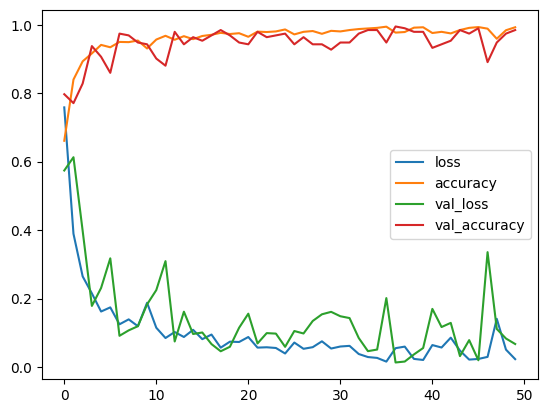

In [19]:
pd.DataFrame(history1.history).plot()

1. We have 99 percent accuracy and it looks good

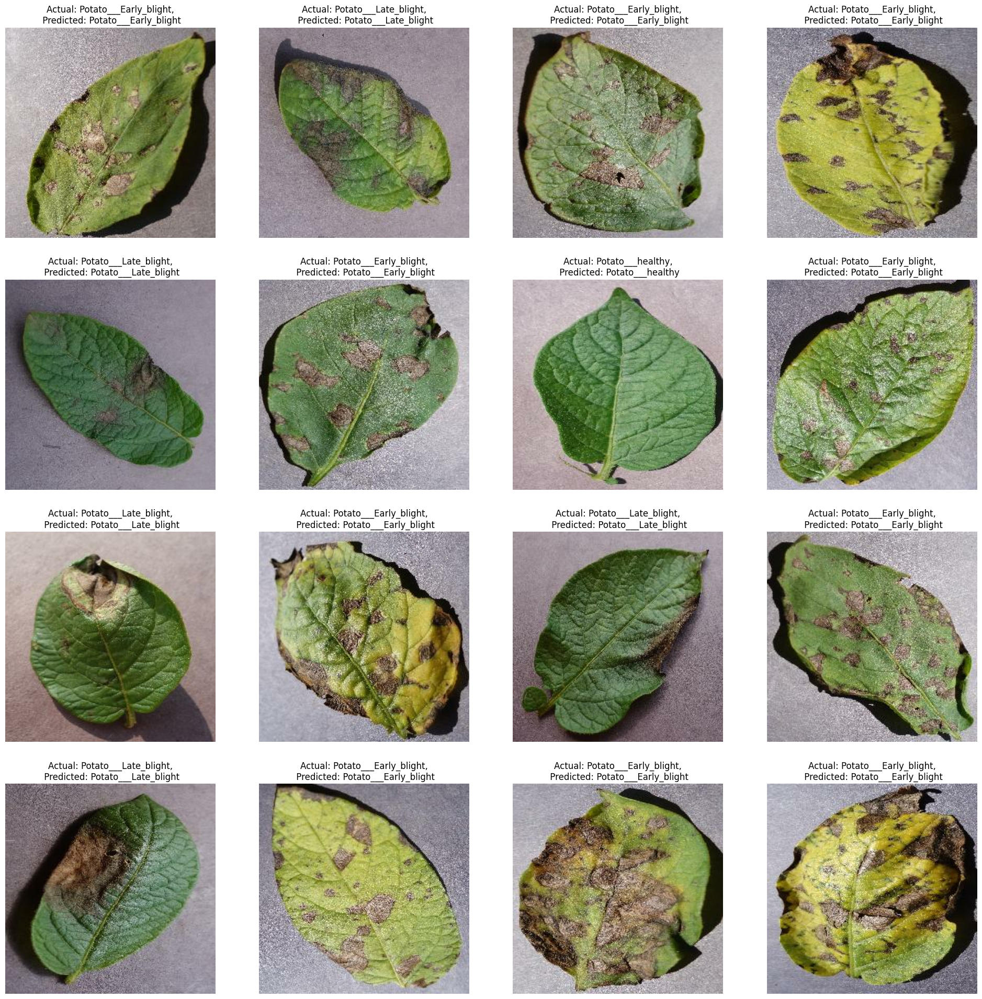

In [20]:
fig, axes = plt.subplots(4,4, figsize=(24,24))
for image_batch, label_batch in test_data.take(1):
    for i,ax in enumerate(axes.flat):
        ax.imshow(image_batch[i].numpy().astype('uint8'))
        batch_prediction = model1.predict(image_batch)
        ax.set_title(f"Actual: {classnames[label_batch[i].numpy()]},\n Predicted: {classnames[np.argmax(batch_prediction[i])]}")
        ax.set_axis_off()

# Making a fuction to predict images and their confidence

In [21]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(image_batch[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Creating a batch
    
    predictions = model1.predict(img_array)
    
    predicted_class = classnames[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

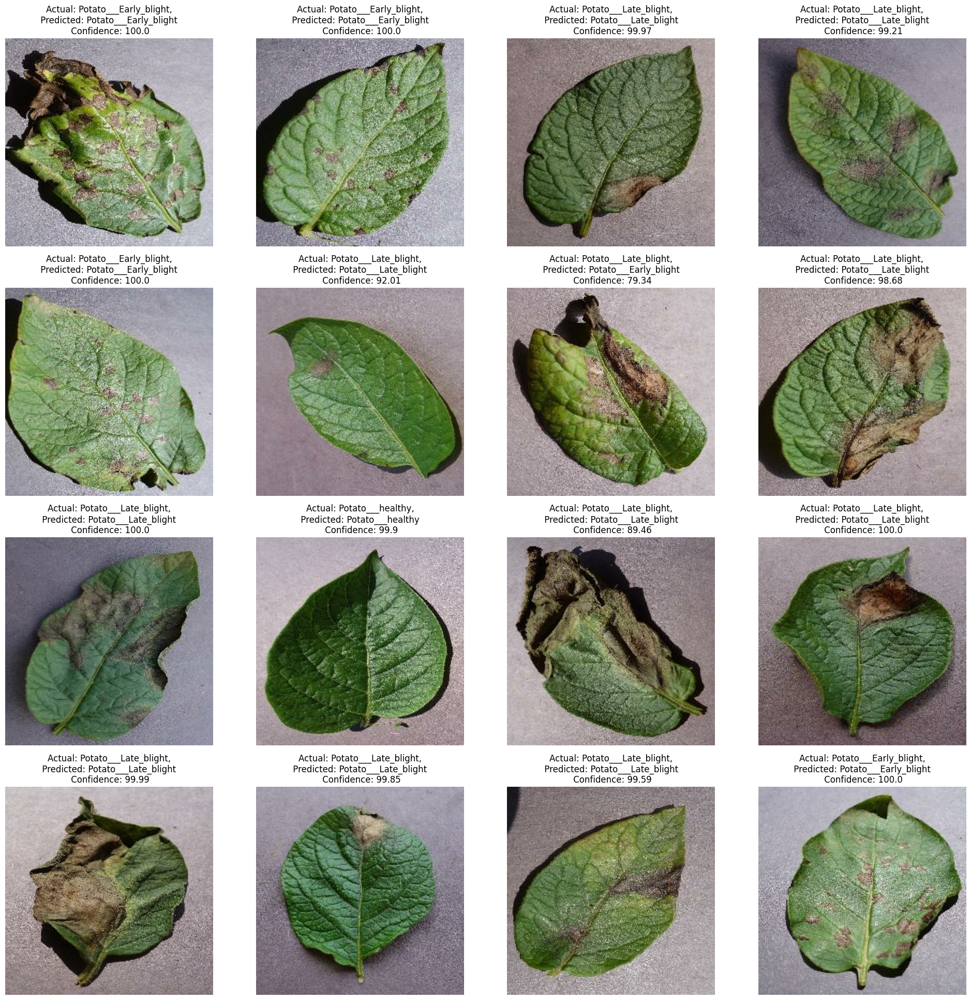

In [22]:
fig, axes = plt.subplots(4,4, figsize=(24,24))
for image_batch, label_batch in test_data.take(1):
    for i,ax in enumerate(axes.flat):
        ax.imshow(image_batch[i].numpy().astype('uint8'))
        
        predicted_class, confidence = predict(model1, image_batch[i].numpy())
        
        batch_prediction = model1.predict(image_batch)
        ax.set_title(f"Actual: {classnames[label_batch[i].numpy()]},\n Predicted: {classnames[np.argmax(batch_prediction[i])]} \n Confidence: {confidence}")
        ax.set_axis_off()

# Saving the model on disk

In [25]:
model_version = 'version1'
model1.save(f'../model/{model_version}')

INFO:tensorflow:Assets written to: ../model/version1\assets
